### NOTE: This notebook is used for testing, It's not guaranteed to work on your machine

In [2]:
%load_ext autoreload
%autoreload 2
import rasterio
import os
import numpy as np
from tqdm import tqdm
import pandas as pd
import torch
from torchvision import transforms
import utilities
from evaluation import rle_encoder_decoder
from evaluation import evaluation_function
from skimage.transform import resize
from unet import UNet
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import run_inference

109231.tif: 4 bands
109231.tif: 1 bands


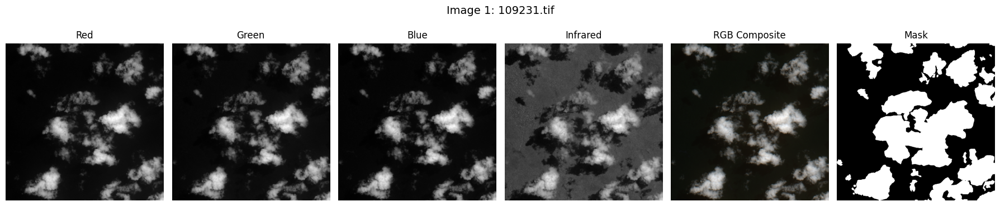

109330.tif: 4 bands
109330.tif: 1 bands


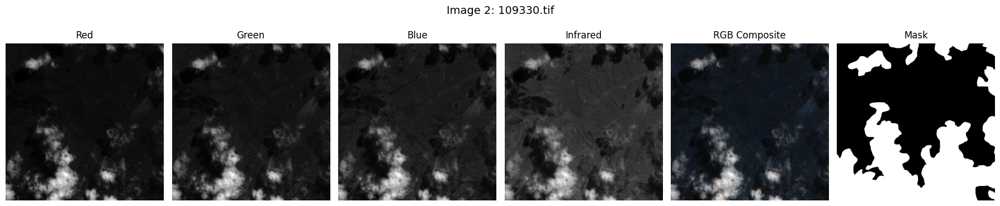

109576.tif: 4 bands
109576.tif: 1 bands


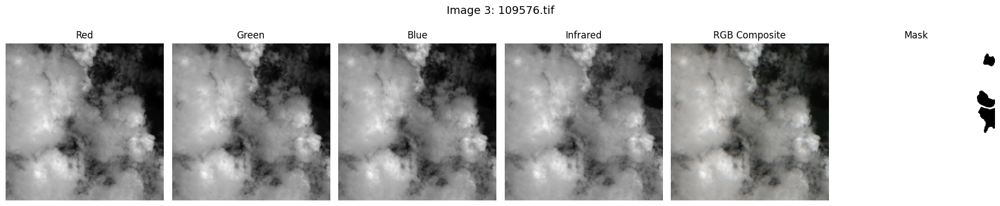

109585.tif: 4 bands
109585.tif: 1 bands


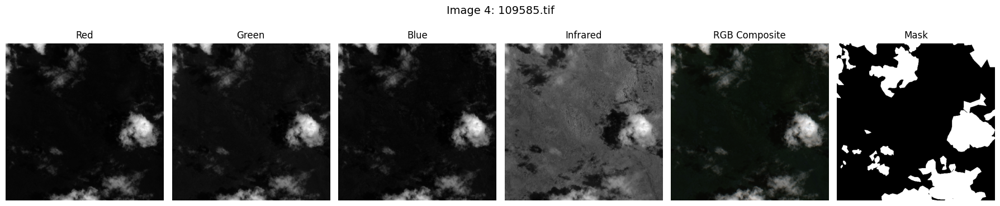

109738.tif: 4 bands
109738.tif: 1 bands


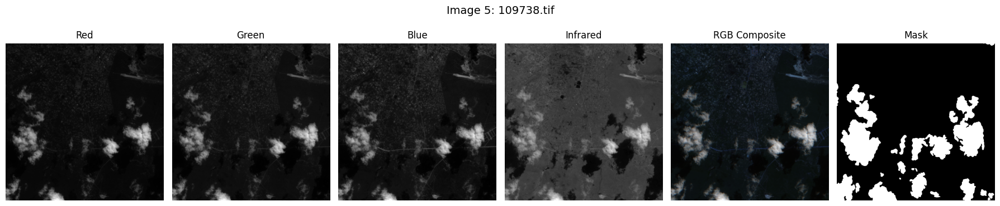

109756.tif: 4 bands
109756.tif: 1 bands


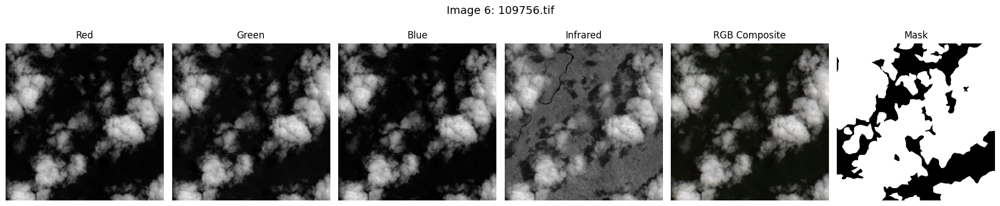

109767.tif: 4 bands
109767.tif: 1 bands


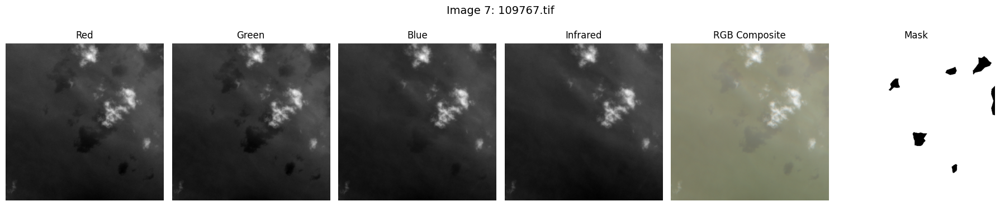

109853.tif: 4 bands
109853.tif: 1 bands


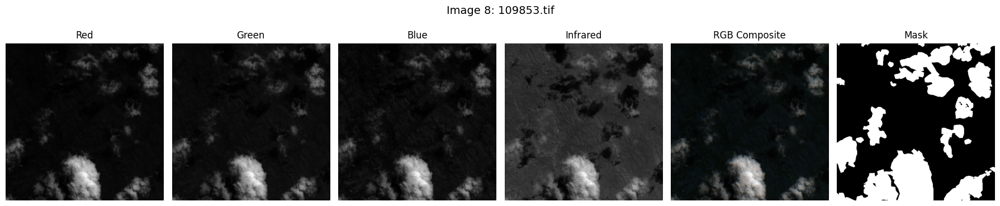

109909.tif: 4 bands
109909.tif: 1 bands


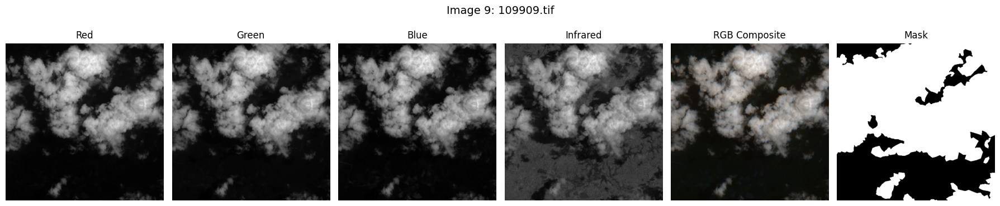

IndexError: list index out of range

In [5]:
# Paths
image_folder = "clean/data"
mask_folder = "clean/masks"

## Load TIFF image using rasterio
def load_tif(path):
    with rasterio.open(path) as src:
        print(f"{os.path.basename(path)}: {src.count} bands")
        return src.read()  # (bands, H, W)

# File lists
image_files = sorted([f for f in os.listdir(image_folder)])
length = len(image_files)
image_files = image_files[length - 10 : length - 1]


# Display loop
for i in range(length):
    image_path = os.path.join(image_folder, image_files[i])
    mask_path = os.path.join(mask_folder, image_files[i])
    
    image = load_tif(image_path)  # (C, H, W)
    mask = load_tif(mask_path)[0]  # (H, W)

    num_channels = image.shape[0]
    assert num_channels >= 4, "Expected at least 4 channels (R, G, B, IR)"
    
    # Normalize each channel individually
    channels = []
    for ch in range(4):
        band = image[ch].astype(np.float32)
        band = band / band.max() if band.max() > 0 else band
        channels.append(band)

    # RGB composite (bands 0, 1, 2)
    rgb = np.stack([channels[0], channels[1], channels[2]], axis=-1)
    rgb = np.clip(rgb, 0, 255)

    # Normalize mask
    mask = mask.astype(np.float32)
    mask = mask / mask.max() if mask.max() > 0 else mask

    # Plot layout: 6 subplots
    plt.figure(figsize=(18, 4))

    titles = ["Red", "Green", "Blue", "Infrared", "RGB Composite", "Mask"]
    images_to_plot = channels[:4] + [rgb, mask]

    for j, img in enumerate(images_to_plot):
        plt.subplot(1, 6, j + 1)
        if j < 4 or j == 5:
            plt.imshow(img, cmap="gray")
        else:
            plt.imshow(img)  # RGB composite
        plt.title(titles[j])
        plt.axis("off")

    plt.suptitle(f"Image {i+1}: {image_files[i]}", fontsize=14)
    plt.tight_layout()
    plt.show()

In [4]:
model = UNet()
model.load_state_dict(torch.load('models/instance_norm_e3.pkl'))
with open('thresholds/unet_best_threshold.txt', 'r') as f:
    best_threshold = float(f.read())
print(best_threshold)

0.46666666666666673


C:\Users\Dell\AppData\Local\Temp\ipykernel_18872\2579632315.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('models/instance_norm_e3.pkl

In [5]:
torch.save(model, 'models/whole_instance_norm_e3.pkl')

In [60]:
data_files = utilities.filterDataset('cleaned')
mean, std = utilities.getMeanAndStd(data_files)
transform = utilities.transforms.Compose([transforms.Normalize(mean, std)])

In [5]:
data_files = utilities.filterDataset('reviewed')

ids = []
originals = []

for f in tqdm(data_files, desc="Generating Solution"):
    original_mask_path = 'dataset/masks/' + f
    original_image_path = 'dataset/data/' + f

    id = os.path.splitext(f)[0]

    with rasterio.open(original_mask_path) as src:
        original_mask = src.read(1).astype(np.float32)
    original_mask = resize(original_mask, (256, 256), order=0, preserve_range=True, anti_aliasing=False).astype(original_mask.dtype)

    original = rle_encoder_decoder.rle_encode(original_mask)

    originals.append(original)
    ids.append(id)

solution_df = pd.DataFrame({
    'id' : ids,
    'segmentation': originals
})

submission_df = run_inference.generateSubmission('inputs/reviewed/data')
    
print(evaluation_function.score(solution_df, submission_df, 'id'))

Generating Solution: 100%|██████████| 850/850 [00:06<00:00, 131.48it/s]
d:\University\4th year\2nd Semester\Satellite Imaging\Project\run_inference.py:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to t

Model Loaded Successfully
Threshold Loaded Successfully


Generating Submission: 100%|██████████| 850/850 [00:41<00:00, 20.25it/s]


0.9028298490205913


In [48]:
def display_image_and_mask(image_path, mask):
    with rasterio.open(image_path) as src:
        image = src.read()  # shape: (C, H, W)
    image = image.astype(np.float32)

    img_min = image.min(axis=(1, 2), keepdims=True)
    img_max = image.max(axis=(1, 2), keepdims=True)
    image = (image - img_min) / (img_max - img_min + 1e-6)  

    image = resize(image.transpose(1, 2, 0), (512, 512), order=1, mode='reflect', preserve_range=True)
    image = image.transpose(2, 0, 1)

    img_min = image.min(axis=(1, 2), keepdims=True)
    img_max = image.max(axis=(1, 2), keepdims=True)
    image = (image - img_min) / (img_max - img_min + 1e-6)

    image = image[:3].transpose(1, 2 ,0)
    image = (image - image.min()) / (image.max() - image.min() + 1e-6)
    
    filename = os.path.basename(image_path)  # Returns '000002.tif'

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(image)
    axes[0].set_title("Image")
    axes[1].imshow(mask, cmap='gray', vmin=0, vmax=1)
    axes[1].set_title("Mask")
    fig.suptitle(filename)

    plt.show()
    return fig

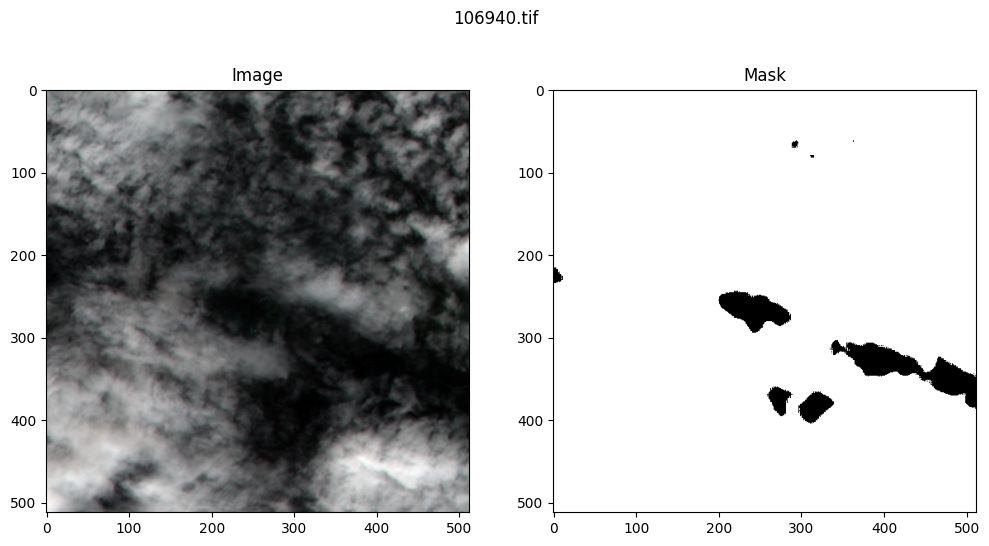

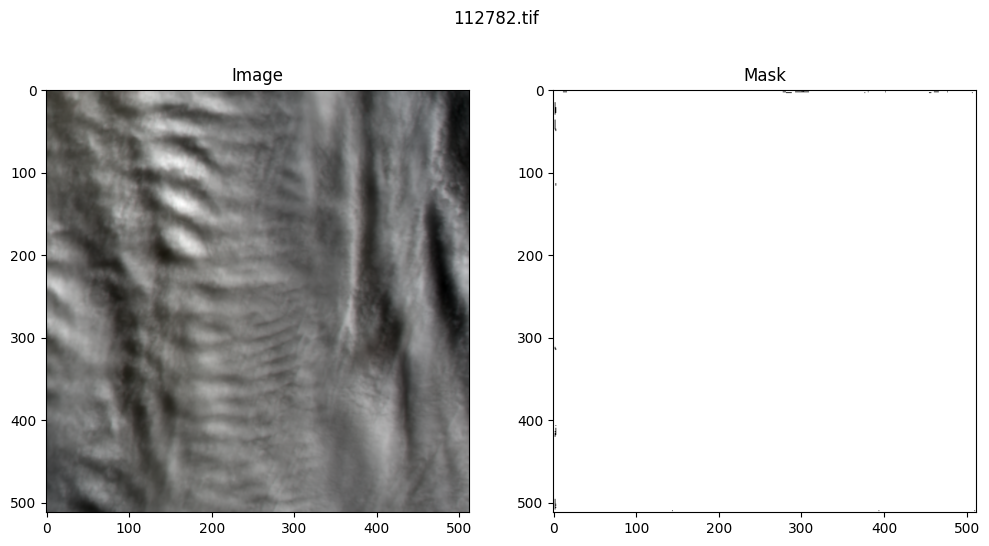

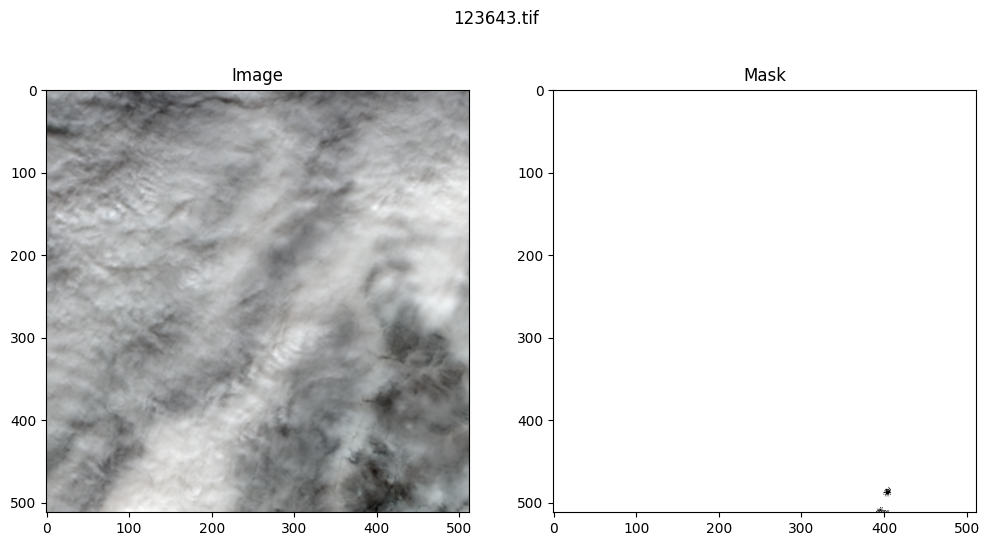

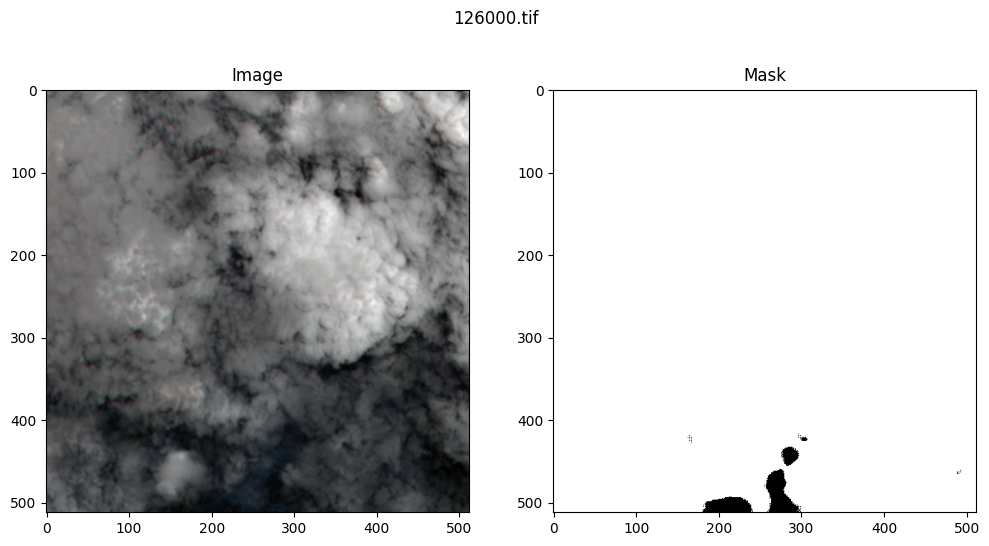

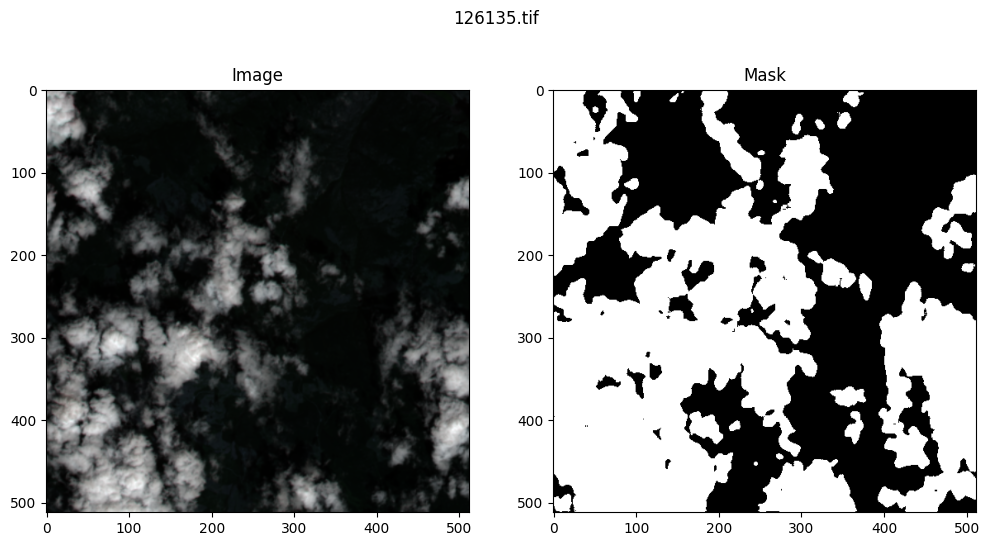

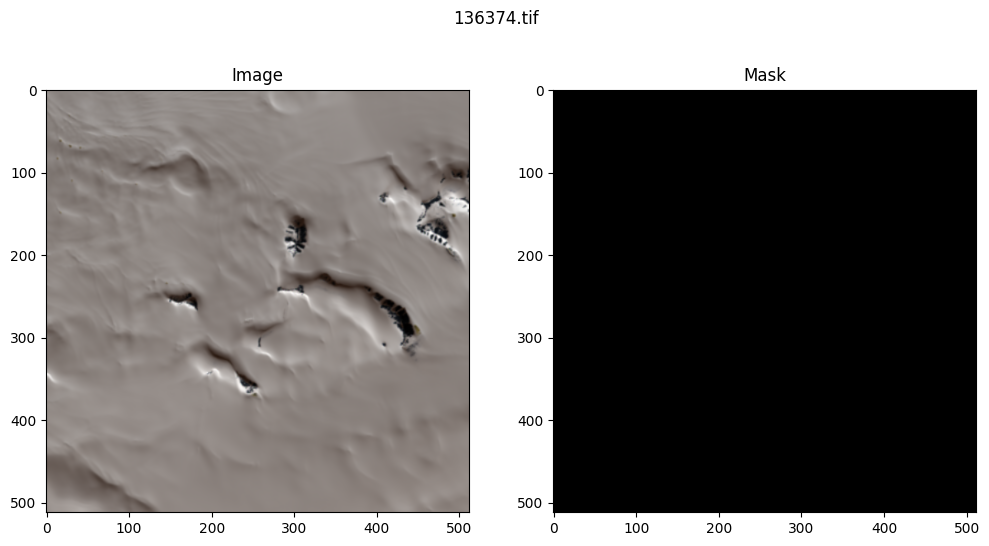

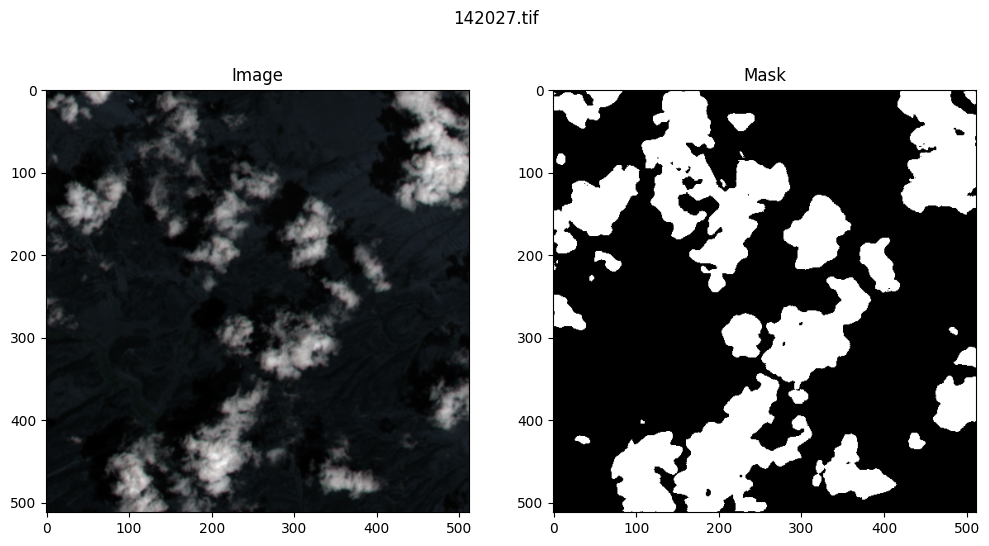

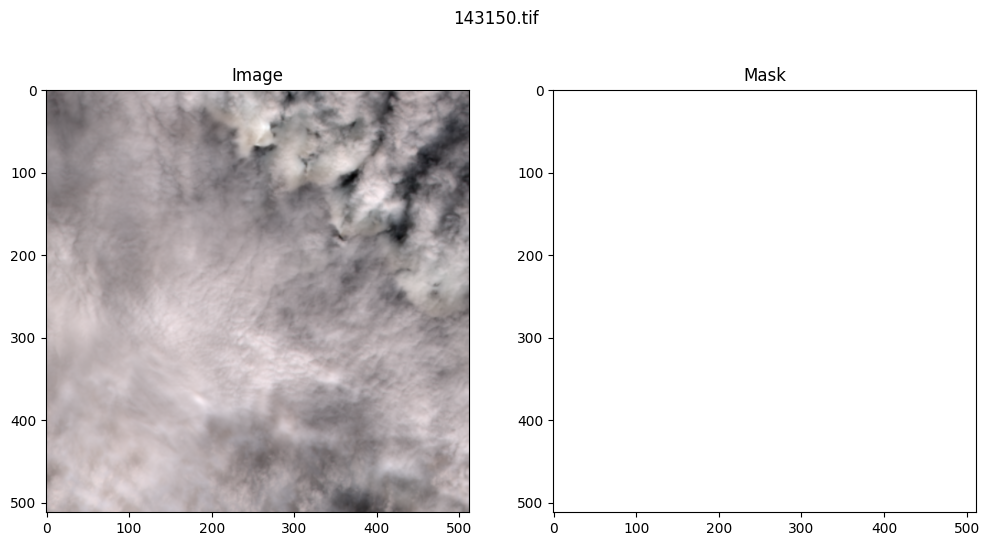

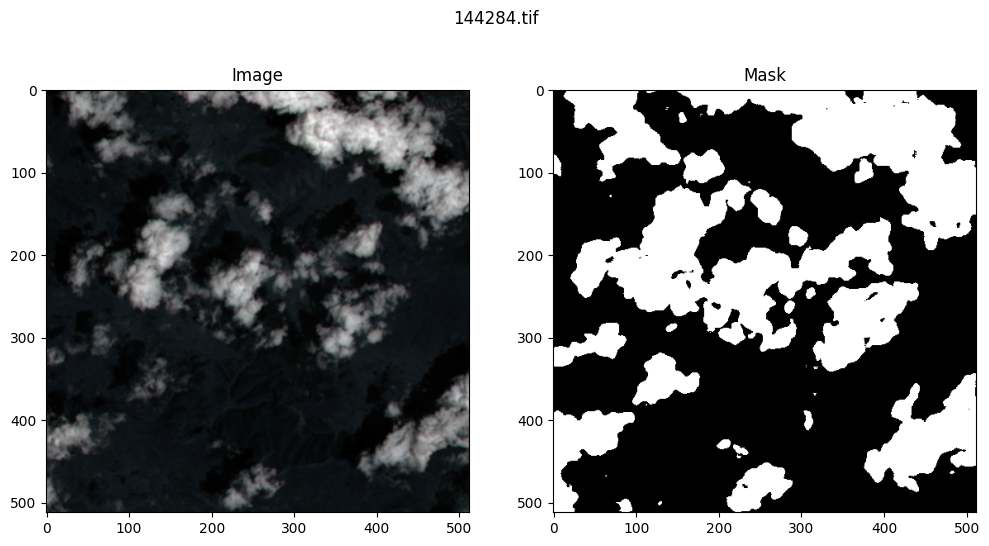

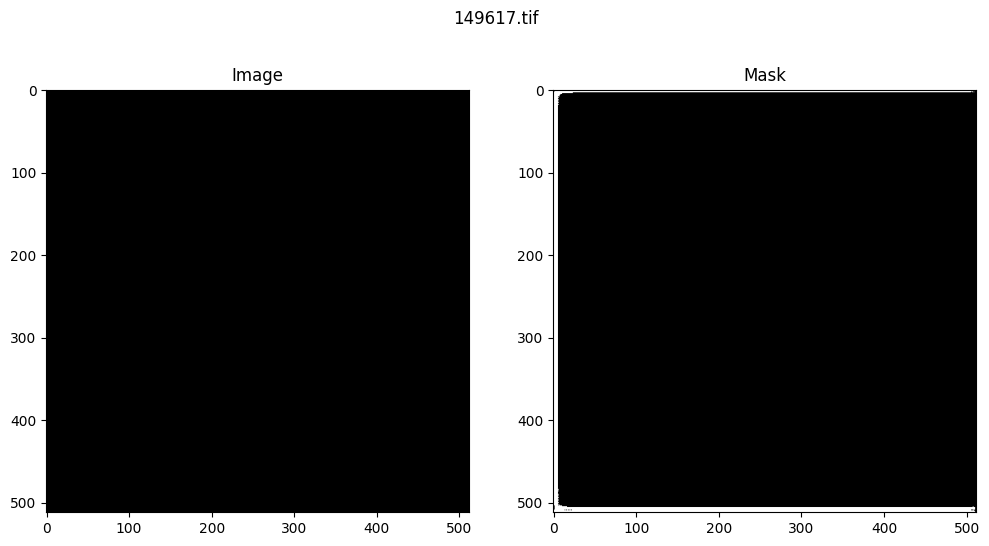

In [ ]:
test_files = [f for f in os.listdir('test/test/data')][100:110]
data_files = utilities.filterDataset('cleaned')
mean, std = utilities.getMeanAndStd(data_files)
for f in test_files:
    img_path = 'test/test/data/' + f
    
    pred = utilities.inference(model, img_path, 0.95)
    
    display_image_and_mask(img_path, pred)
    

In [39]:
test_files = [f for f in os.listdir('test/test/data')]

total_mean = np.zeros(4)  # Assuming RGB channels (3 channels)
total_std = np.zeros(4)
num_images = 0
for file in tqdm(test_files, desc="Calculating mean/std"):
    
    image_path = os.path.join('test/test/data', file)
    
    with rasterio.open(image_path) as src:
        image = src.read().astype(np.float32)  # Read the image as a NumPy array
        
        # Compute per-image mean and std
        mean = np.mean(image, axis=(1, 2))  # Mean over height and width (H, W) for each channel
        std = np.std(image, axis=(1, 2))   # Std over height and width (H, W) for each channel
        
        # Update total mean and std
        total_mean += mean
        total_std += std
        num_images += 1

# Compute overall mean and std for all images
overall_mean = total_mean / num_images
overall_std = total_std / num_images

Calculating mean/std: 100%|██████████| 316/316 [00:02<00:00, 126.57it/s]


tensor([[[-1.9570, -1.9960, -2.0090,  ..., -1.0039, -1.0419, -1.0939],
         [-2.0590, -2.0900, -2.0320,  ..., -1.0779, -1.1259, -1.1259],
         [-2.1780, -2.2040, -2.0900,  ..., -1.1339, -1.1399, -1.1919],
         ...,
         [-1.6329, -1.6079, -1.5639,  ..., -3.1587, -3.1592, -3.1615],
         [-1.6749, -1.6409, -1.5859,  ..., -3.1602, -3.1617, -3.1625],
         [-1.6139, -1.5529, -1.5609,  ..., -3.1612, -3.1625, -3.1600]],

        [[-1.9010, -1.9413, -1.9262,  ..., -1.0041, -1.0383, -1.0464],
         [-2.0240, -2.0240, -1.9504,  ..., -1.0595, -1.0716, -1.0847],
         [-2.1187, -2.0592, -1.9101,  ..., -1.0635, -1.0676, -1.0897],
         ...,
         [-1.6098, -1.5473, -1.5060,  ..., -3.0391, -3.0361, -3.0282],
         [-1.5402, -1.4858, -1.5060,  ..., -3.0348, -3.0338, -3.0351],
         [-1.5241, -1.4536, -1.4959,  ..., -3.0320, -3.0351, -3.0406]],

        [[-1.9139, -1.9007, -1.8524,  ..., -1.0712, -1.0892, -1.0920],
         [-2.0053, -1.9584, -1.8524,  ..., -1

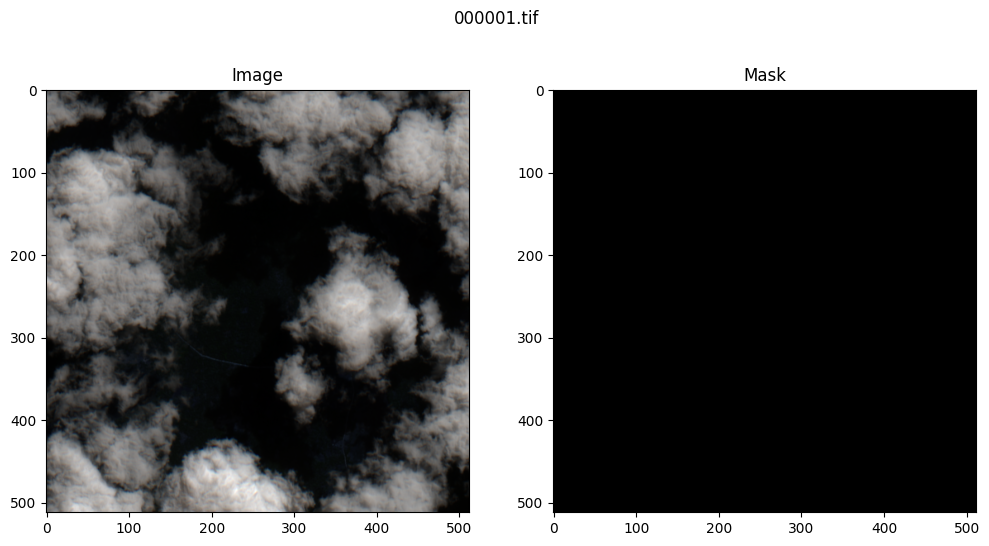

tensor([[[-0.4919, -0.4919, -0.4839,  ..., -0.7259, -0.7239, -0.7239],
         [-0.4919, -0.4959, -0.4999,  ..., -0.7399, -0.7299, -0.7359],
         [-0.4879, -0.4879, -0.5059,  ..., -0.7199, -0.7359, -0.7319],
         ...,
         [-3.0665, -3.0597, -3.0790,  ..., -1.1579, -1.1399, -1.1219],
         [-3.0397, -3.0467, -3.0777,  ..., -1.1799, -1.1399, -1.0999],
         [-3.0535, -3.0610, -3.0935,  ..., -1.1399, -1.1219, -1.0919]],

        [[-0.4982, -0.4941, -0.4881,  ..., -0.7481, -0.7098, -0.7300],
         [-0.5183, -0.4982, -0.5002,  ..., -0.7421, -0.7259, -0.7300],
         [-0.5183, -0.5062, -0.5062,  ..., -0.7239, -0.7421, -0.7461],
         ...,
         [-2.9963, -2.9708, -2.9814,  ..., -1.1210, -1.1099, -1.1079],
         [-2.9925, -2.9733, -2.9965,  ..., -1.1613, -1.1341, -1.0938],
         [-2.9975, -2.9917, -3.0088,  ..., -1.1663, -1.1170, -1.0676]],

        [[-0.6044, -0.5911, -0.5892,  ..., -0.7937, -0.8089, -0.8051],
         [-0.6044, -0.5949, -0.5892,  ..., -0

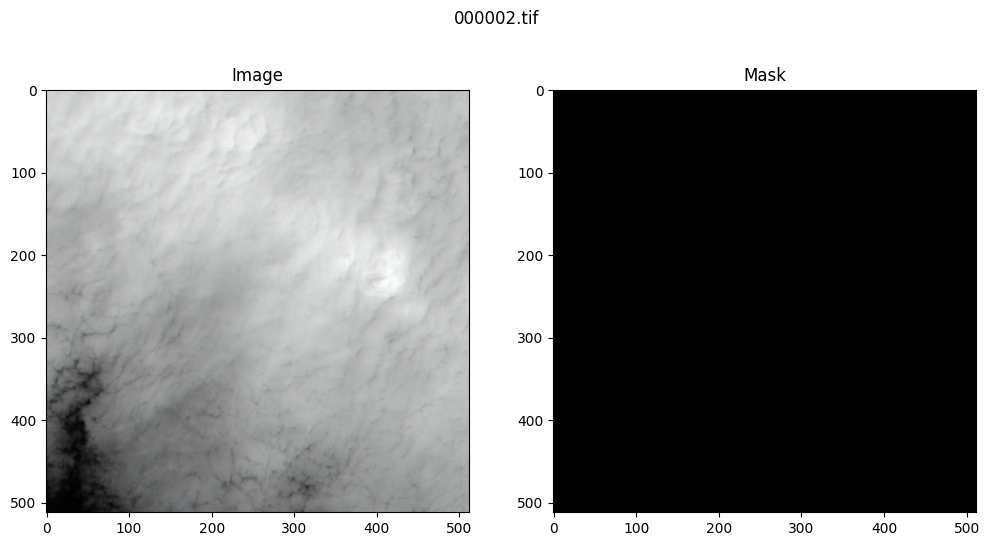

tensor([[[-1.3959, -1.4089, -1.3989,  ..., -0.6739, -0.6599, -0.6659],
         [-1.4179, -1.4089, -1.4169,  ..., -0.6819, -0.6659, -0.6659],
         [-1.4399, -1.4239, -1.4169,  ..., -0.6879, -0.6619, -0.6519],
         ...,
         [-0.8639, -0.8919, -0.9159,  ..., -1.0059, -0.9999, -1.0119],
         [-0.8799, -0.9099, -0.9379,  ..., -1.0119, -1.0059, -1.0139],
         [-0.9019, -0.9379, -0.9519,  ..., -0.9999, -1.0279, -1.0159]],

        [[-1.3981, -1.3810, -1.3558,  ..., -0.7199, -0.7279, -0.7279],
         [-1.4062, -1.4082, -1.3891,  ..., -0.7199, -0.7159, -0.7300],
         [-1.4253, -1.4294, -1.4092,  ..., -0.7239, -0.7199, -0.7279],
         ...,
         [-0.9295, -0.9517, -0.9739,  ..., -1.0323, -1.0283, -1.0283],
         [-0.9597, -0.9819, -0.9880,  ..., -1.0323, -1.0404, -1.0303],
         [-0.9880, -1.0081, -1.0081,  ..., -1.0404, -1.0404, -1.0343]],

        [[-1.3931, -1.3780, -1.3467,  ..., -0.8941, -0.8865, -0.8865],
         [-1.4329, -1.4130, -1.3931,  ..., -0

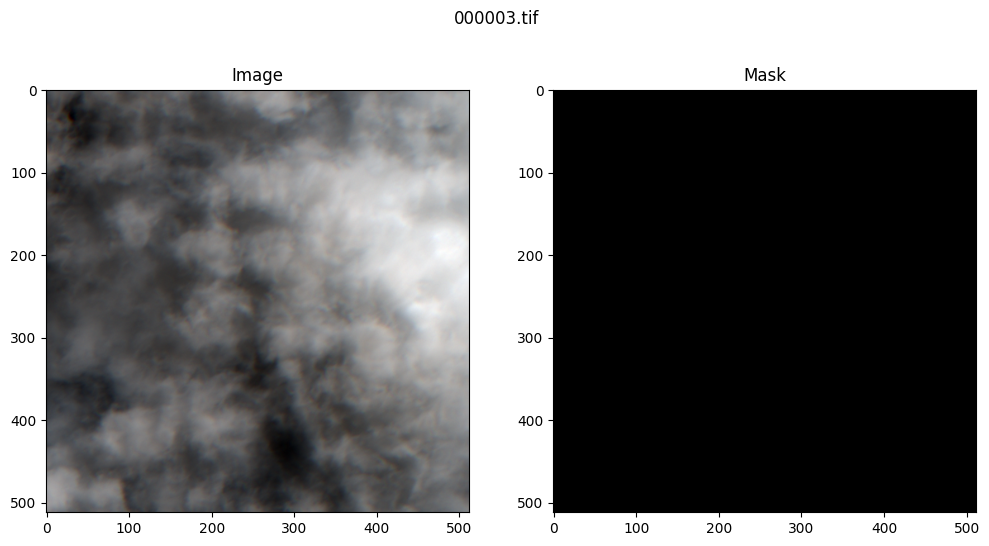

tensor([[[-0.6239, -0.6479, -0.6739,  ..., -0.4439, -0.4499, -0.3999],
         [-0.6319, -0.6419, -0.6799,  ..., -0.3999, -0.3819, -0.3659],
         [-0.6479, -0.6639, -0.6959,  ..., -0.3399, -0.3079, -0.2819],
         ...,
         [-1.1539, -1.1039, -1.0779,  ...,  0.5021,  0.4981,  0.6801],
         [-0.0599, -0.0379, -0.0379,  ...,  0.5921,  0.6541,  0.9021],
         [-0.1739, -0.1339, -0.1419,  ...,  0.6461,  0.7301,  0.9581]],

        [[-0.6594, -0.6695, -0.7038,  ..., -0.4659, -0.4679, -0.4679],
         [-0.6735, -0.6655, -0.6856,  ..., -0.4639, -0.4619, -0.4518],
         [-0.6816, -0.6735, -0.6897,  ..., -0.4296, -0.4095, -0.3994],
         ...,
         [-1.0222, -1.0121, -0.9557,  ...,  0.4592,  0.3403,  0.3887],
         [ 0.0581,  0.0662,  0.0662,  ...,  0.5157,  0.4250,  0.5479],
         [-0.0306, -0.0991, -0.0749,  ...,  0.5600,  0.5560,  0.7535]],

        [[-0.7597, -0.7710, -0.8146,  ..., -0.6252, -0.5930, -0.6082],
         [-0.7710, -0.7786, -0.7824,  ..., -0

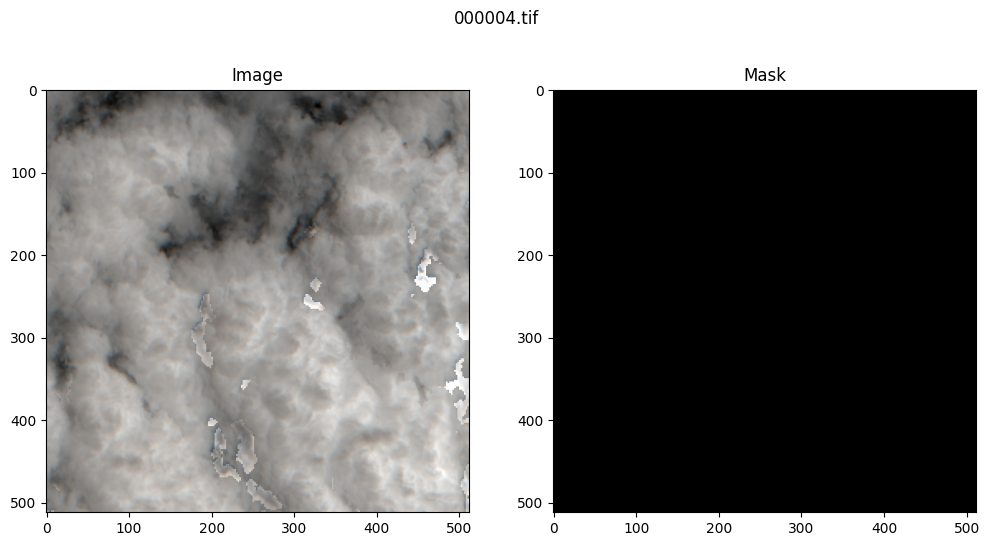

tensor([[[-2.6710, -2.6880, -2.7850,  ..., -2.3535, -2.3325, -2.2940],
         [-2.5700, -2.5830, -2.7005,  ..., -2.3510, -2.3325, -2.3150],
         [-2.5115, -2.4960, -2.5715,  ..., -2.3670, -2.3490, -2.3705],
         ...,
         [-2.6315, -2.5815, -2.5750,  ..., -3.0437, -3.0390, -3.0845],
         [-2.6255, -2.5605, -2.5390,  ..., -3.0880, -3.0855, -3.1115],
         [-2.6240, -2.5615, -2.5370,  ..., -3.0565, -3.0655, -3.1092]],

        [[-2.4236, -2.4069, -2.4891,  ..., -2.2563, -2.2145, -2.2099],
         [-2.3767, -2.3581, -2.3948,  ..., -2.2815, -2.2679, -2.2749],
         [-2.3500, -2.3384, -2.3500,  ..., -2.3596, -2.3822, -2.3666],
         ...,
         [-2.4901, -2.4296, -2.4130,  ..., -2.9093, -2.9096, -2.9287],
         [-2.4921, -2.4473, -2.4170,  ..., -2.8778, -2.8877, -2.9108],
         [-2.5218, -2.4770, -2.4195,  ..., -2.8821, -2.8773, -2.8844]],

        [[-2.3088, -2.2680, -2.2993,  ..., -2.2439, -2.2382, -2.2467],
         [-2.3012, -2.2704, -2.2752,  ..., -2

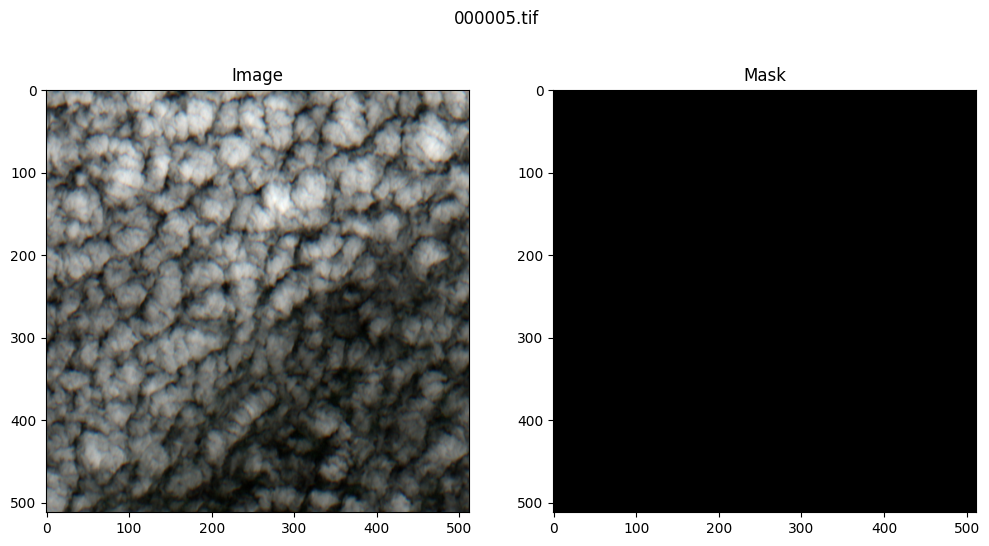

tensor([[[-2.7600, -2.7725, -2.8030,  ..., -2.8790, -2.9700, -3.0197],
         [-2.7895, -2.7615, -2.7725,  ..., -2.8570, -2.9030, -2.9800],
         [-2.7905, -2.7840, -2.7895,  ..., -2.8090, -2.7760, -2.9140],
         ...,
         [-3.1005, -3.0990, -3.0985,  ..., -2.7800, -2.8275, -2.8185],
         [-3.1037, -3.0990, -3.0980,  ..., -2.7985, -2.8505, -2.8330],
         [-3.1040, -3.1015, -3.0967,  ..., -2.8795, -2.8340, -2.8330]],

        [[-2.5914, -2.5984, -2.6140,  ..., -2.7556, -2.7960, -2.8509],
         [-2.6196, -2.6090, -2.6019,  ..., -2.7189, -2.7466, -2.8181],
         [-2.6100, -2.6055, -2.5984,  ..., -2.7002, -2.6448, -2.7476],
         ...,
         [-2.8607, -2.8673, -2.8703,  ..., -2.6418, -2.6795, -2.6513],
         [-2.8612, -2.8657, -2.8667,  ..., -2.6367, -2.6851, -2.7118],
         [-2.8574, -2.8574, -2.8554,  ..., -2.7209, -2.6639, -2.6680]],

        [[-2.4016, -2.4181, -2.4267,  ..., -2.5933, -2.5729, -2.6459],
         [-2.4243, -2.4120, -2.4134,  ..., -2

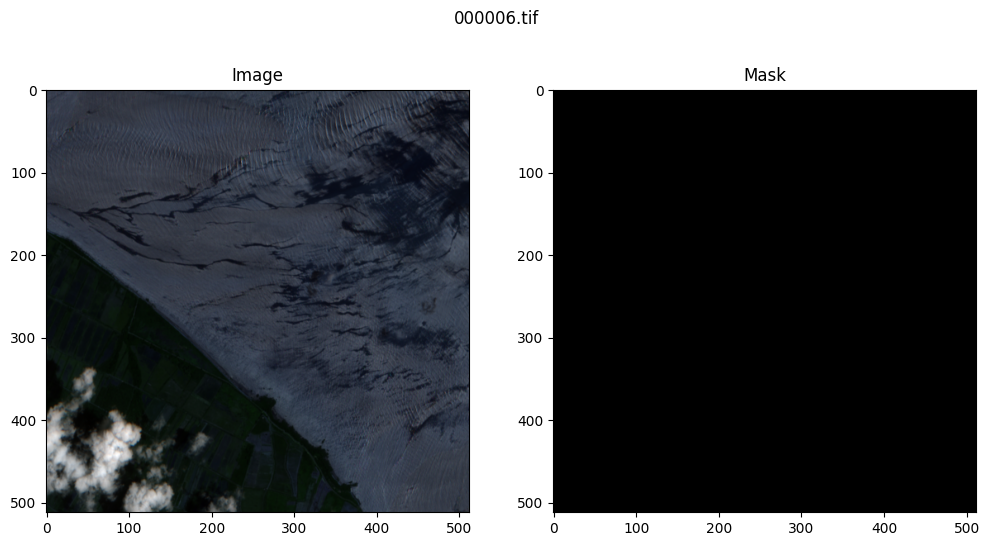

tensor([[[-0.9519, -0.9559, -0.9399,  ..., -0.7079, -0.6759, -0.6839],
         [-0.9359, -0.9459, -0.9359,  ..., -0.7399, -0.7199, -0.6919],
         [-0.9259, -0.9179, -0.9359,  ..., -0.7579, -0.7479, -0.7079],
         ...,
         [-1.0139, -1.0079, -1.0219,  ..., -0.8879, -0.9339, -0.9279],
         [-1.0079, -1.0139, -1.0079,  ..., -0.9179, -0.9259, -0.9499],
         [-1.0139, -1.0339, -1.0199,  ..., -0.9459, -0.9579, -0.9999]],

        [[-0.9295, -0.9456, -0.9376,  ..., -0.7179, -0.6977, -0.6977],
         [-0.9235, -0.9416, -0.9376,  ..., -0.7400, -0.7118, -0.6937],
         [-0.9295, -0.9295, -0.9194,  ..., -0.7642, -0.7400, -0.7199],
         ...,
         [-1.0041, -0.9960, -1.0001,  ..., -0.8973, -0.8932, -0.9194],
         [-0.9920, -0.9880, -0.9880,  ..., -0.9053, -0.9134, -0.9295],
         [-0.9920, -1.0101, -1.0182,  ..., -0.9295, -0.9134, -0.9537]],

        [[-1.0096, -1.0191, -1.0210,  ..., -0.8089, -0.8070, -0.7956],
         [-1.0153, -1.0096, -1.0210,  ..., -0

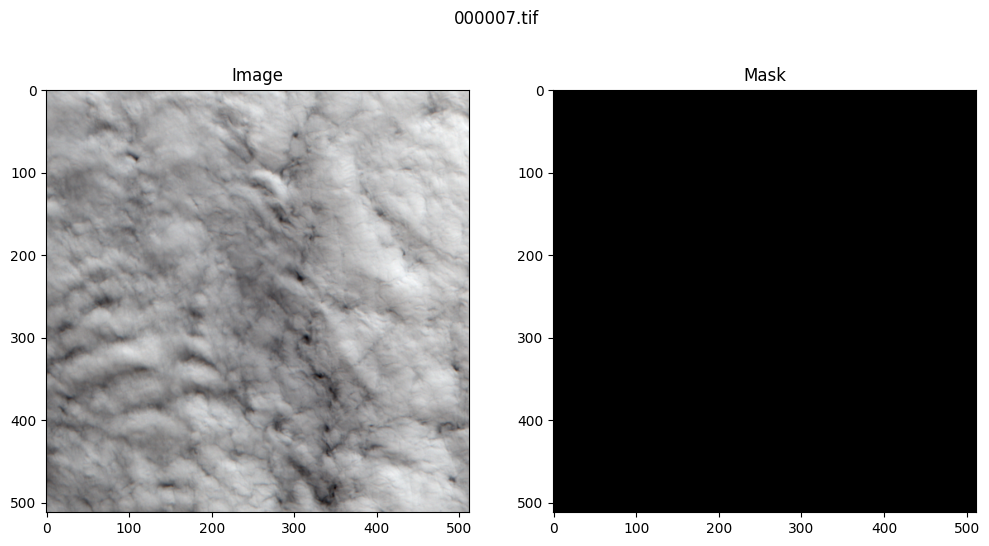

tensor([[[-3.1587, -3.1565, -3.1635,  ..., -3.1175, -3.1072, -3.1155],
         [-3.1570, -3.1585, -3.1615,  ..., -3.1107, -3.1097, -3.1135],
         [-3.1590, -3.1655, -3.1642,  ..., -3.1087, -3.1107, -3.1197],
         ...,
         [-3.1220, -3.1275, -3.1240,  ..., -0.9879, -0.9579, -0.8619],
         [-3.1212, -3.1262, -3.1217,  ..., -1.0239, -0.9779, -0.8759],
         [-3.1210, -3.1197, -3.1212,  ..., -1.0939, -1.0159, -0.9739]],

        [[-3.0179, -3.0300, -3.0325,  ..., -2.9343, -2.9464, -2.9688],
         [-3.0157, -3.0303, -3.0330,  ..., -2.9307, -2.9547, -2.9723],
         [-3.0174, -3.0280, -3.0315,  ..., -2.9260, -2.9524, -2.9700],
         ...,
         [-2.9443, -2.9406, -2.9539,  ..., -1.0444, -0.9658, -0.9053],
         [-2.9471, -2.9426, -2.9461,  ..., -1.1170, -1.0323, -1.0142],
         [-2.9365, -2.9381, -2.9391,  ..., -1.1321, -1.0998, -1.0938]],

        [[-2.8918, -2.9070, -2.9103,  ..., -2.8146, -2.7988, -2.8016],
         [-2.8904, -2.9067, -2.9110,  ..., -2

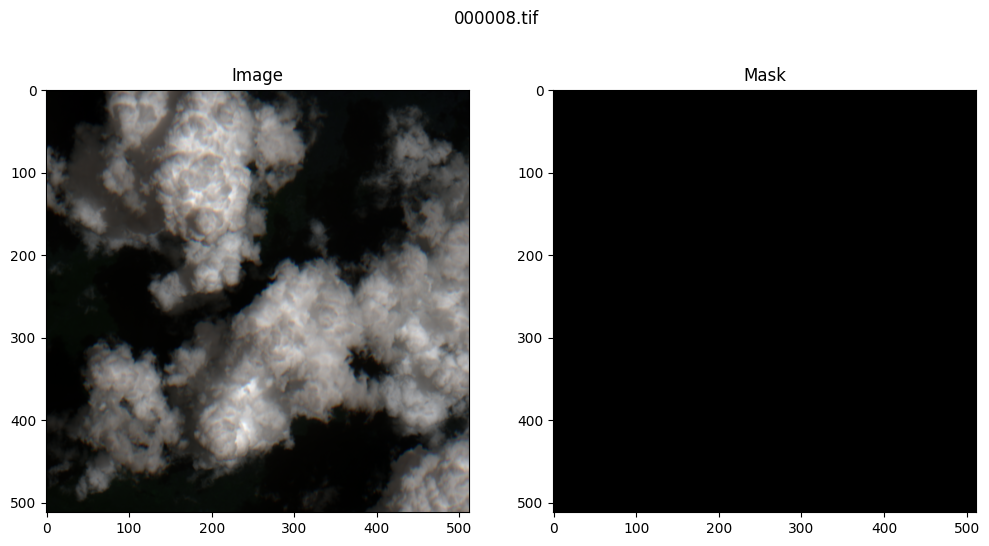

tensor([[[-2.7910, -2.8555, -2.8825,  ..., -3.1480, -3.1537, -3.1542],
         [-2.7510, -2.8305, -2.8525,  ..., -3.1497, -3.1567, -3.1555],
         [-2.7335, -2.7675, -2.7745,  ..., -3.1522, -3.1587, -3.1585],
         ...,
         [-1.6549, -1.5189, -1.4839,  ..., -1.0139, -0.9719, -0.8299],
         [-1.8019, -1.7029, -1.6439,  ..., -1.0359, -0.9459, -0.7699],
         [-1.6239, -1.5239, -1.5359,  ..., -0.9939, -0.9119, -0.8499]],

        [[-2.6181, -2.6932, -2.7184,  ..., -3.0240, -3.0245, -3.0230],
         [-2.6025, -2.6775, -2.7239,  ..., -3.0209, -3.0293, -3.0343],
         [-2.5894, -2.6413, -2.6594,  ..., -3.0230, -3.0272, -3.0396],
         ...,
         [-1.6249, -1.5483, -1.4838,  ..., -0.9255, -1.0021, -0.9033],
         [-1.8587, -1.7156, -1.6279,  ..., -0.9819, -1.0021, -0.8348],
         [-1.7882, -1.6823, -1.6138,  ..., -1.0041, -0.9376, -0.7783]],

        [[-2.4816, -2.5640, -2.6047,  ..., -2.8873, -2.8909, -2.8925],
         [-2.4996, -2.5744, -2.6170,  ..., -2

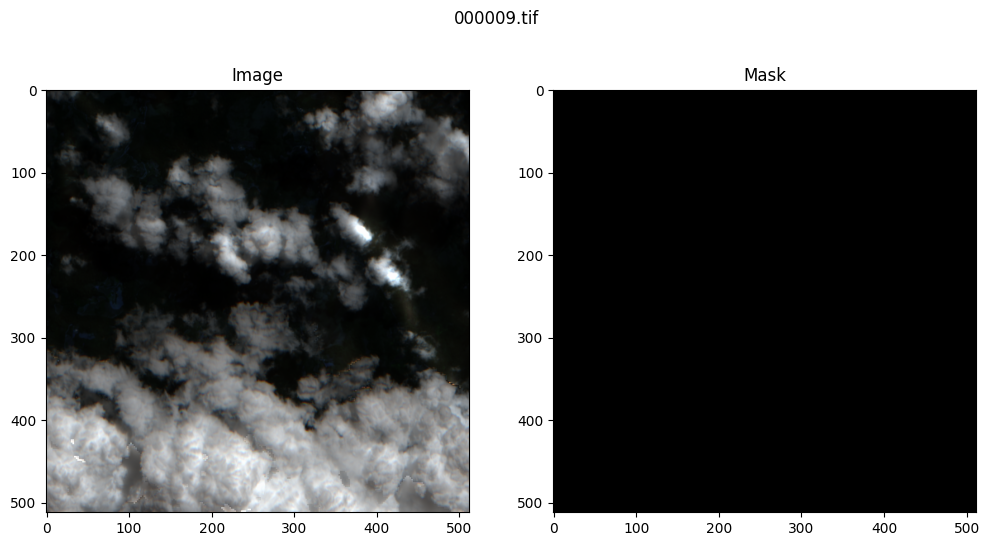

tensor([[[-2.2700, -2.2550, -2.1970,  ..., -1.1139, -1.1799, -1.2209],
         [-2.2740, -2.2465, -2.2110,  ..., -1.1599, -1.2219, -1.2469],
         [-2.2550, -2.2210, -2.2030,  ..., -1.2969, -1.3139, -1.2649],
         ...,
         [-2.2250, -2.2630, -2.2940,  ..., -0.8699, -0.8699, -0.8619],
         [-2.2230, -2.2570, -2.2820,  ..., -0.8839, -0.8839, -0.8819],
         [-2.2455, -2.2710, -2.2755,  ..., -0.9159, -0.9059, -0.8859]],

        [[-2.1948, -2.1746, -2.1550,  ..., -1.3145, -1.3608, -1.3225],
         [-2.1908, -2.1671, -2.1353,  ..., -1.4082, -1.4747, -1.4112],
         [-2.1817, -2.1570, -2.1293,  ..., -1.2963, -1.3750, -1.5009],
         ...,
         [-2.1625, -2.1933, -2.2124,  ..., -0.9819, -0.9577, -0.9416],
         [-2.1842, -2.2165, -2.2321,  ..., -0.9940, -0.9900, -0.9739],
         [-2.2074, -2.2356, -2.2704,  ..., -1.0021, -1.0242, -1.0162]],

        [[-2.1412, -2.1222, -2.0952,  ..., -1.3553, -1.4168, -1.5285],
         [-2.1539, -2.1303, -2.1142,  ..., -1

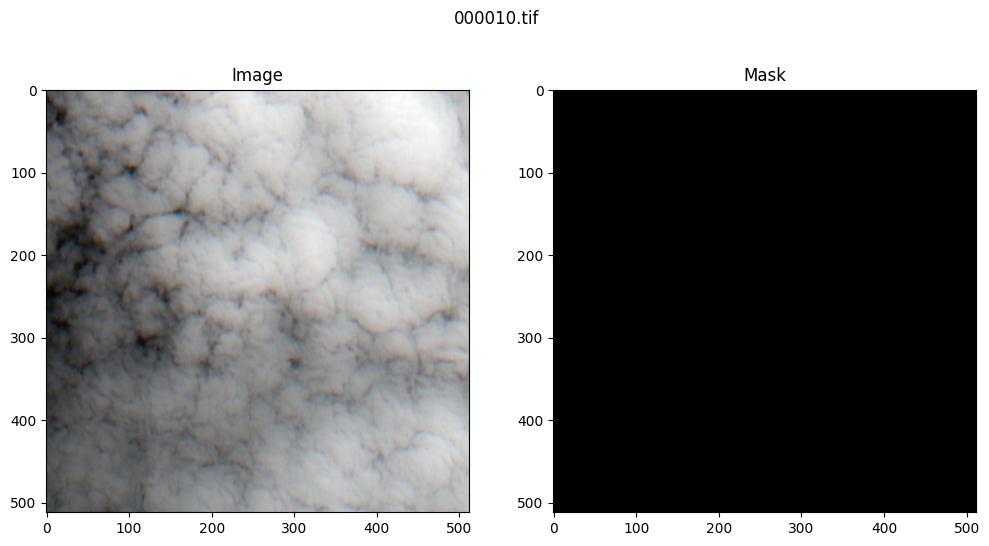

tensor([[[-3.0847, -3.0990, -3.0997,  ..., -3.0410, -3.0355, -3.0417],
         [-3.0912, -3.0975, -3.1030,  ..., -3.0550, -3.0605, -3.0612],
         [-3.1070, -3.1015, -3.1047,  ..., -3.0617, -3.0777, -3.0537],
         ...,
         [-3.0542, -3.0082, -3.0167,  ..., -3.0500, -3.0662, -3.0527],
         [-3.0462, -2.9825, -3.0130,  ..., -3.0790, -3.0670, -3.0572],
         [-3.0517, -3.0435, -3.0357,  ..., -3.0952, -3.0845, -3.0667]],

        [[-2.8657, -2.8879, -2.9005,  ..., -2.8216, -2.8080, -2.8227],
         [-2.8680, -2.8942, -2.9098,  ..., -2.8363, -2.8378, -2.8413],
         [-2.9066, -2.9043, -2.9076,  ..., -2.8438, -2.8615, -2.8388],
         ...,
         [-2.8015, -2.7662, -2.7869,  ..., -2.8398, -2.8579, -2.8388],
         [-2.7768, -2.7360, -2.7299,  ..., -2.8620, -2.8607, -2.8433],
         [-2.8005, -2.8222, -2.7753,  ..., -2.8849, -2.8856, -2.8534]],

        [[-2.7088, -2.7377, -2.7450,  ..., -2.6506, -2.6326, -2.6416],
         [-2.7065, -2.7405, -2.7521,  ..., -2

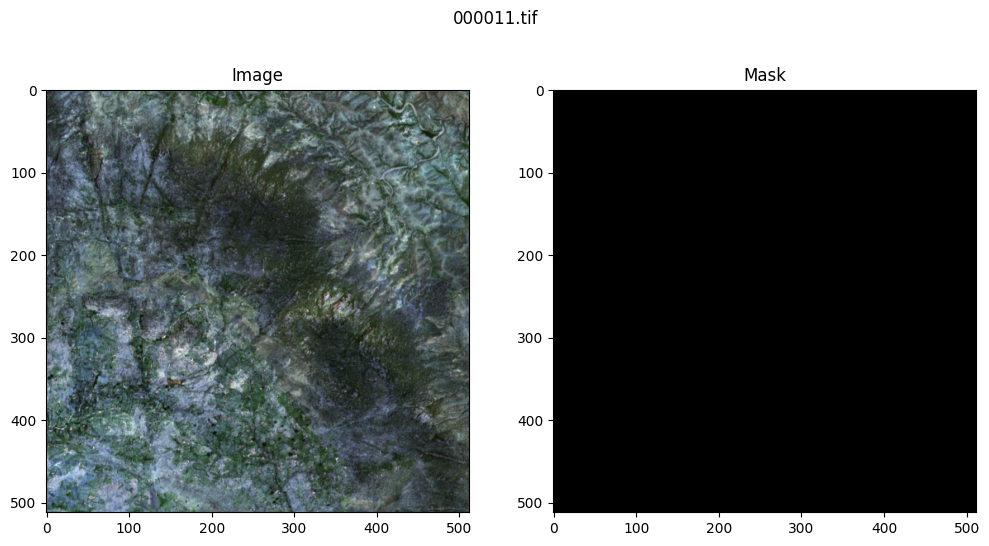

tensor([[[-3.1002, -3.1355, -3.1507,  ..., -3.0432, -2.9375, -2.8915],
         [-3.1067, -3.1362, -3.1487,  ..., -3.0572, -2.9650, -2.8975],
         [-3.1390, -3.1485, -3.1520,  ..., -3.0675, -3.0157, -2.9505],
         ...,
         [-3.1477, -3.1515, -3.1452,  ..., -3.1555, -3.1682, -3.1712],
         [-3.1547, -3.1570, -3.1530,  ..., -3.1617, -3.1607, -3.1687],
         [-3.1615, -3.1620, -3.1487,  ..., -3.1560, -3.1642, -3.1665]],

        [[-3.0247, -3.0487, -3.0670,  ..., -2.9534, -2.8448, -2.8005],
         [-3.0345, -3.0560, -3.0688,  ..., -2.9814, -2.8937, -2.8282],
         [-3.0539, -3.0620, -3.0711,  ..., -2.9713, -2.9252, -2.8746],
         ...,
         [-3.0615, -3.0613, -3.0628,  ..., -3.0766, -3.0852, -3.0854],
         [-3.0731, -3.0698, -3.0676,  ..., -3.0696, -3.0739, -3.0809],
         [-3.0764, -3.0693, -3.0673,  ..., -3.0794, -3.0681, -3.0751]],

        [[-2.8932, -2.9152, -2.9278,  ..., -2.8277, -2.7323, -2.6932],
         [-2.9051, -2.9223, -2.9309,  ..., -2

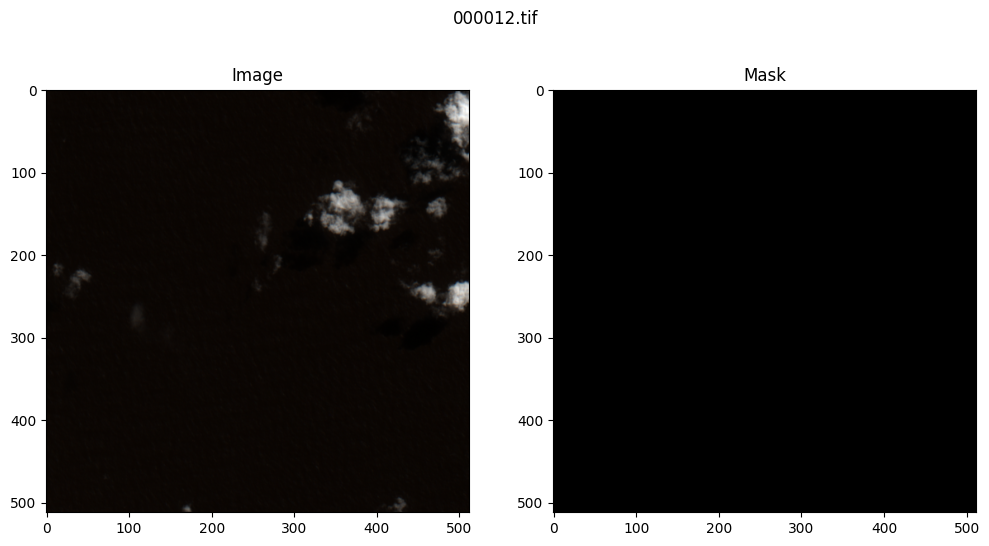

tensor([[[-3.1560, -3.1562, -3.1592,  ..., -3.1172, -3.1042, -3.0942],
         [-3.1430, -3.1465, -3.1292,  ..., -3.1280, -3.1337, -3.1040],
         [-3.1380, -3.1057, -3.1010,  ..., -3.1057, -3.1335, -3.1120],
         ...,
         [-3.1832, -3.1910, -3.1840,  ..., -3.1850, -3.1722, -3.1835],
         [-3.1955, -3.1872, -3.1957,  ..., -3.1852, -3.1827, -3.1682],
         [-3.1935, -3.1872, -3.1992,  ..., -3.1755, -3.1665, -3.1665]],

        [[-2.9373, -2.9433, -2.9461,  ..., -2.9151, -2.8912, -2.8662],
         [-2.9360, -2.9270, -2.9373,  ..., -2.9194, -2.9234, -2.8879],
         [-2.9219, -2.8801, -2.8882,  ..., -2.8836, -2.9197, -2.8811],
         ...,
         [-2.9567, -2.9567, -2.9673,  ..., -2.9522, -2.9630, -2.9645],
         [-2.9635, -2.9597, -2.9716,  ..., -2.9506, -2.9575, -2.9564],
         [-2.9690, -2.9713, -2.9703,  ..., -2.9433, -2.9431, -2.9519]],

        [[-2.7948, -2.8109, -2.8191,  ..., -2.7261, -2.6941, -2.6549],
         [-2.7604, -2.7417, -2.7749,  ..., -2

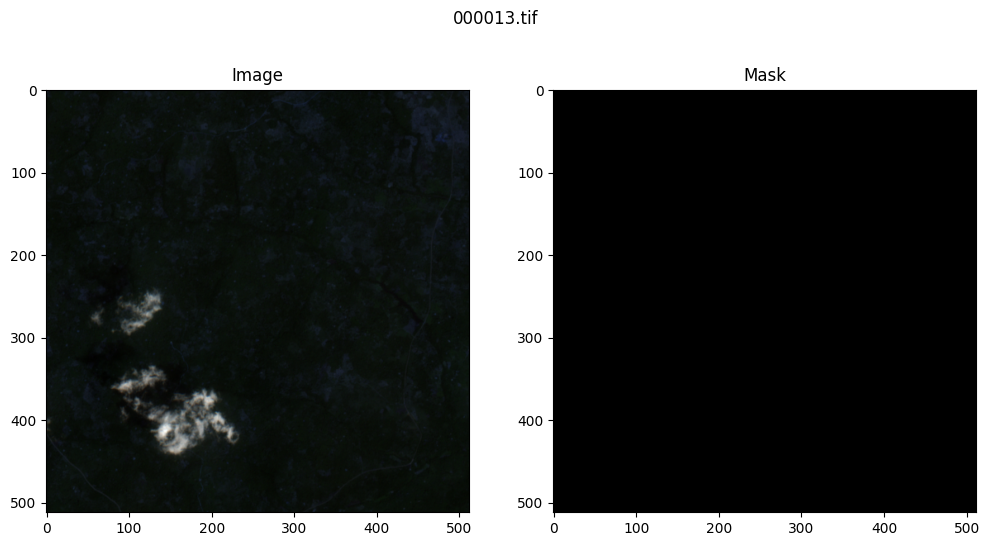

tensor([[[-2.9495, -2.9605, -2.9435,  ..., -3.0387, -3.0255, -3.0097],
         [-2.9525, -2.9485, -2.9395,  ..., -3.0232, -3.0267, -3.0082],
         [-2.9420, -2.9250, -2.9335,  ..., -3.0202, -3.0145, -2.9755],
         ...,
         [-3.0212, -3.0260, -3.0195,  ..., -2.7680, -2.7600, -2.7615],
         [-3.0327, -3.0127, -3.0072,  ..., -2.7545, -2.7445, -2.7495],
         [-3.0212, -3.0185, -2.9930,  ..., -2.7500, -2.7305, -2.7235]],

        [[-2.7965, -2.8070, -2.7884,  ..., -2.9108, -2.8849, -2.8564],
         [-2.8055, -2.7980, -2.7813,  ..., -2.8980, -2.8887, -2.8559],
         [-2.7949, -2.7713, -2.7743,  ..., -2.8730, -2.8690, -2.8353],
         ...,
         [-2.8950, -2.8849, -2.8819,  ..., -2.7325, -2.7289, -2.7279],
         [-2.8987, -2.8831, -2.8685,  ..., -2.7345, -2.7199, -2.7103],
         [-2.8927, -2.8814, -2.8539,  ..., -2.7214, -2.7052, -2.7017]],

        [[-2.6719, -2.6795, -2.6369,  ..., -2.8272, -2.8127, -2.7974],
         [-2.6960, -2.6728, -2.6369,  ..., -2

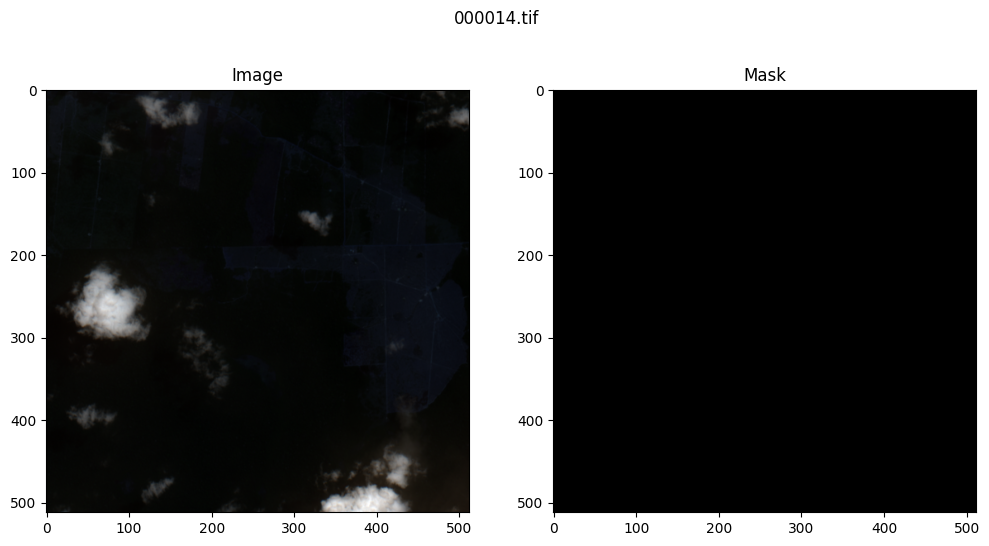

tensor([[[-2.9640, -2.9700, -2.9775,  ..., -3.0002, -3.0005, -2.9950],
         [-2.9690, -2.9700, -2.9695,  ..., -2.9972, -2.9995, -2.9950],
         [-2.9740, -2.9740, -2.9705,  ..., -2.9992, -2.9967, -2.9975],
         ...,
         [-2.9585, -2.9605, -2.9625,  ..., -2.8175, -2.8590, -2.8820],
         [-2.9565, -2.9605, -2.9575,  ..., -2.8215, -2.8635, -2.8765],
         [-2.9540, -2.9615, -2.9605,  ..., -2.8270, -2.8585, -2.8805]],

        [[-2.8116, -2.8201, -2.8227,  ..., -2.8494, -2.8458, -2.8468],
         [-2.8176, -2.8267, -2.8211,  ..., -2.8479, -2.8418, -2.8438],
         [-2.8267, -2.8242, -2.8176,  ..., -2.8473, -2.8393, -2.8418],
         ...,
         [-2.8211, -2.8227, -2.8191,  ..., -2.6271, -2.7138, -2.7461],
         [-2.8176, -2.8237, -2.8206,  ..., -2.6518, -2.7194, -2.7451],
         [-2.8181, -2.8206, -2.8181,  ..., -2.6680, -2.7153, -2.7420]],

        [[-2.6918, -2.6885, -2.6908,  ..., -2.7384, -2.7495, -2.7495],
         [-2.6965, -2.6970, -2.6927,  ..., -2

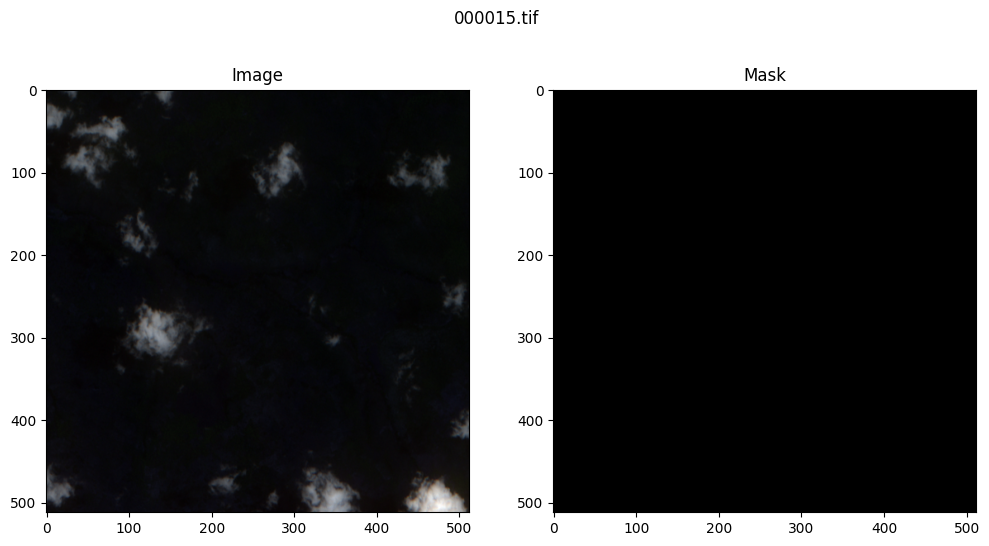

tensor([[[-3.0467, -3.0550, -3.0445,  ..., -2.9962, -3.0012, -3.0100],
         [-3.0495, -3.0445, -3.0455,  ..., -3.0045, -3.0020, -3.0100],
         [-3.0527, -3.0437, -3.0420,  ..., -3.0022, -3.0147, -3.0252],
         ...,
         [-2.9880, -2.9870, -2.9840,  ..., -2.8460, -2.9010, -2.9335],
         [-2.9830, -2.9850, -2.9695,  ..., -2.8515, -2.8960, -2.9350],
         [-2.9805, -2.9785, -2.9665,  ..., -2.8435, -2.8765, -2.9115]],

        [[-2.8307, -2.8353, -2.8353,  ..., -2.7924, -2.7924, -2.8050],
         [-2.8358, -2.8413, -2.8373,  ..., -2.7924, -2.7889, -2.7990],
         [-2.8438, -2.8438, -2.8393,  ..., -2.7965, -2.8005, -2.8146],
         ...,
         [-2.7980, -2.7980, -2.8015,  ..., -2.6594, -2.7047, -2.7612],
         [-2.7919, -2.7889, -2.7864,  ..., -2.6891, -2.7481, -2.7798],
         [-2.7889, -2.7753, -2.7652,  ..., -2.6937, -2.7375, -2.7768]],

        [[-2.7649, -2.7694, -2.7540,  ..., -2.7065, -2.6989, -2.7098],
         [-2.7649, -2.7694, -2.7600,  ..., -2

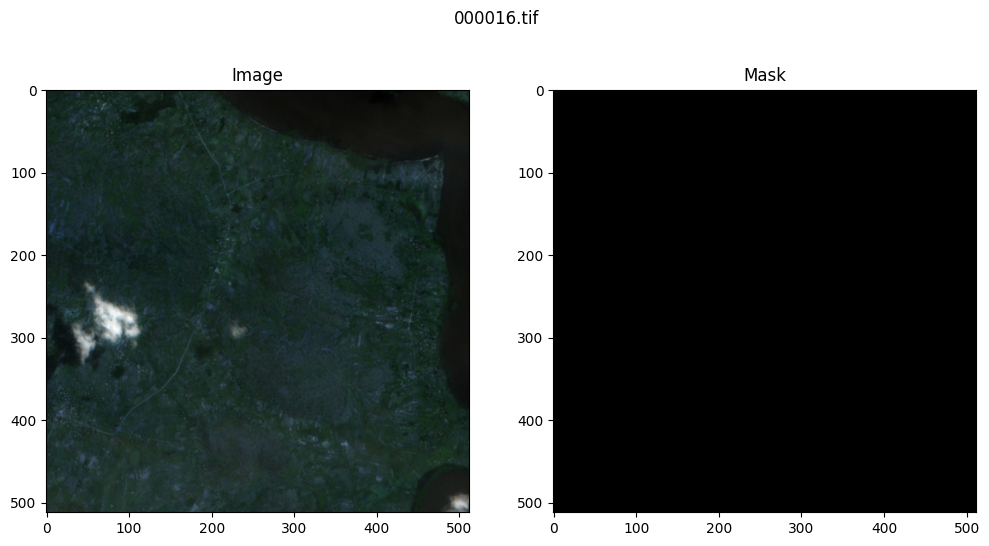

tensor([[[-3.1282, -3.1297, -3.1342,  ..., -3.1305, -3.1365, -3.1450],
         [-3.1297, -3.1305, -3.1385,  ..., -3.1552, -3.1525, -3.1547],
         [-3.1470, -3.1352, -3.1260,  ..., -3.1695, -3.1675, -3.1635],
         ...,
         [-3.1135, -3.1122, -3.1192,  ..., -3.1330, -3.1370, -3.1380],
         [-3.1350, -3.1327, -3.1162,  ..., -3.1295, -3.1310, -3.1295],
         [-3.1310, -3.1250, -3.1200,  ..., -3.1212, -3.1240, -3.1275]],

        [[-2.9305, -2.9325, -2.9315,  ..., -2.9345, -2.9496, -2.9685],
         [-2.9345, -2.9398, -2.9355,  ..., -2.9612, -2.9655, -2.9678],
         [-2.9504, -2.9398, -2.9312,  ..., -2.9862, -2.9763, -2.9680],
         ...,
         [-2.9265, -2.9386, -2.9481,  ..., -2.9617, -2.9786, -2.9912],
         [-2.9408, -2.9461, -2.9330,  ..., -2.9640, -2.9718, -2.9716],
         [-2.9428, -2.9547, -2.9529,  ..., -2.9537, -2.9595, -2.9575]],

        [[-2.7126, -2.7278, -2.7204,  ..., -2.7155, -2.7384, -2.7841],
         [-2.7247, -2.7325, -2.7244,  ..., -2

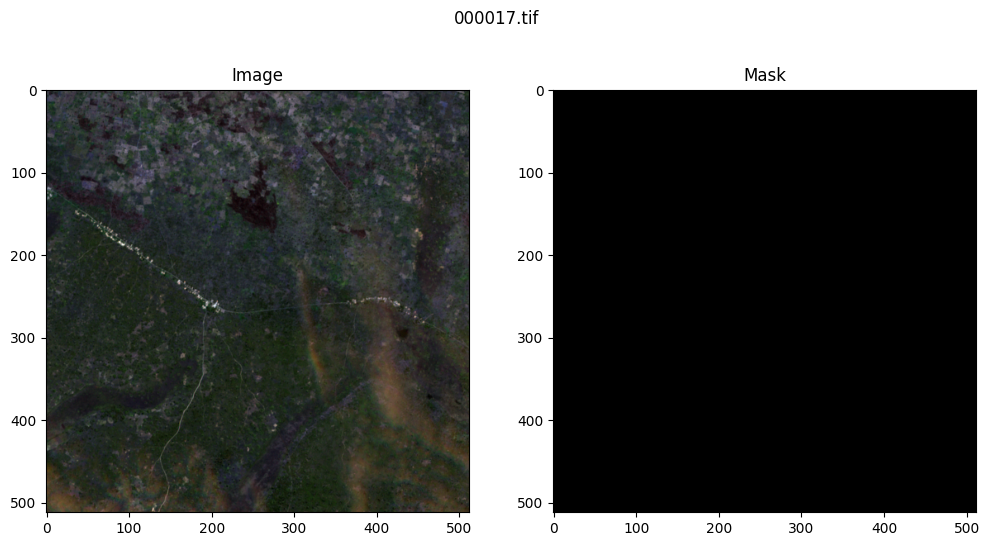

tensor([[[-3.0922, -3.0852, -3.1015,  ..., -3.1685, -3.1662, -3.1445],
         [-3.0997, -3.1185, -3.1315,  ..., -3.1477, -3.1520, -3.1500],
         [-3.0935, -3.1002, -3.1255,  ..., -3.1402, -3.1420, -3.1440],
         ...,
         [-3.0777, -3.0700, -3.0645,  ..., -3.1597, -3.1635, -3.1617],
         [-3.0817, -3.0672, -3.0690,  ..., -3.1670, -3.1700, -3.1590],
         [-3.0777, -3.0737, -3.0792,  ..., -3.1745, -3.1692, -3.1610]],

        [[-2.8695, -2.8524, -2.8798,  ..., -2.9774, -2.9791, -2.9391],
         [-2.8798, -2.8904, -2.9141,  ..., -2.9368, -2.9481, -2.9413],
         [-2.8756, -2.8728, -2.8980,  ..., -2.9134, -2.9121, -2.9237],
         ...,
         [-2.8625, -2.8519, -2.8632,  ..., -2.9995, -3.0091, -2.9837],
         [-2.8584, -2.8594, -2.8678,  ..., -3.0101, -3.0214, -2.9957],
         [-2.8589, -2.8622, -2.8622,  ..., -3.0157, -3.0136, -3.0066]],

        [[-2.7093, -2.7060, -2.7297,  ..., -2.8518, -2.8544, -2.8288],
         [-2.7254, -2.7529, -2.7881,  ..., -2

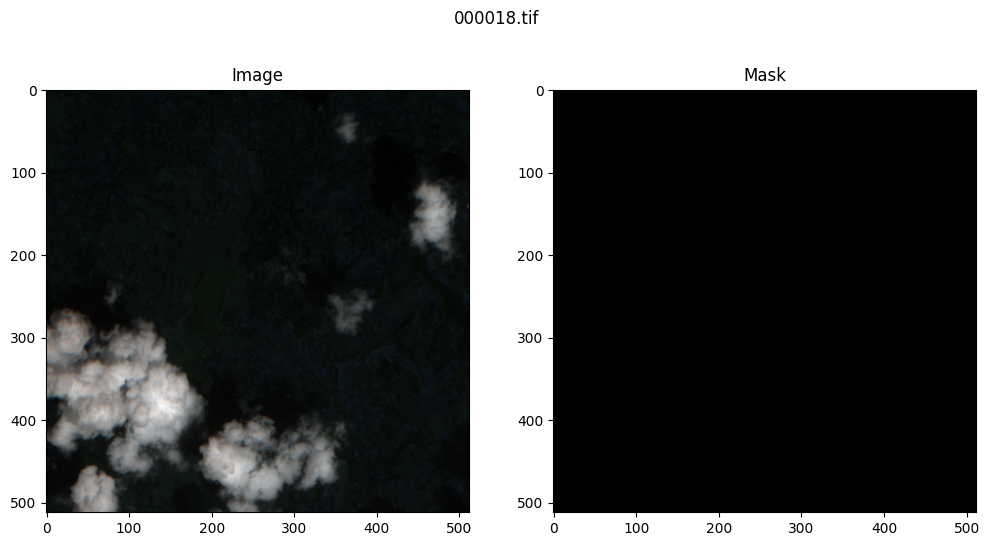

tensor([[[-2.2400, -2.2430, -2.2470,  ..., -1.7729, -1.7999, -1.8249],
         [-2.2465, -2.2550, -2.2600,  ..., -1.7709, -1.7879, -1.8169],
         [-2.2465, -2.2700, -2.2685,  ..., -1.8609, -1.8789, -1.8959],
         ...,
         [-1.6739, -1.6739, -1.6699,  ..., -2.1510, -2.0850, -2.0540],
         [-1.6639, -1.6669, -1.6669,  ..., -2.1510, -2.0900, -2.0680],
         [-1.6669, -1.6739, -1.6749,  ..., -2.1290, -2.0790, -2.0620]],

        [[-2.1338, -2.1369, -2.1036,  ..., -1.9111, -1.9595, -1.9373],
         [-2.1570, -2.1565, -2.1379,  ..., -1.9071, -1.9373, -1.9111],
         [-2.1580, -2.1731, -2.1701,  ..., -1.8899, -1.8708, -1.8486],
         ...,
         [-1.6239, -1.6360, -1.6380,  ..., -2.0461, -2.0210, -2.0139],
         [-1.6319, -1.6319, -1.6319,  ..., -2.0270, -2.0270, -1.9937],
         [-1.6279, -1.6319, -1.6450,  ..., -2.0058, -2.0210, -1.9937]],

        [[-2.0361, -2.0465, -2.0020,  ..., -1.8240, -1.7899, -1.7823],
         [-2.0711, -2.0578, -2.0105,  ..., -1

KeyboardInterrupt: 

In [ ]:
for f in test_files:
    img_path = 'test/test/data/' + f
    pred = utilities.inference(model, img_path, 0.8)
    with rasterio.open(img_path) as file:
        file.read()
    display_image_and_mask(img_path, pred)
    

In [ ]:
solution_df = pd.read_csv('outputs/submission.csv')
submission_df = pd.read_csv('predictions.csv')

print(evaluation_function.score(solution_df, submission_df, 'id'))

0.8726651654838152


In [85]:
solution_df = pd.read_csv('submission.csv')
submission_df = pd.read_csv('zahran.csv')

print(evaluation_function.score(solution_df, submission_df, 'id'))

0.8274641660468913
